In [6]:
import os
from os import listdir
import pandas as pd
import numpy as np
import glob
import tqdm
from typing import Dict
import matplotlib.pyplot as plt

import matplotlib.animation as animation

from matplotlib.widgets import Slider
from IPython.display import HTML


%matplotlib inline

!pip install chart_studio
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable = True, theme = 'pearl')

from colorama import Fore, Back, Style
import seaborn as sns
sns.set(style = 'whitegrid')


import pydicom
import warnings
warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')
plt.show()

     |████████████████████████████████| 64 kB 298 kB/s eta 0:00:011
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [7]:
list(os.listdir('../input/osic-pulmonary-fibrosis-progression'))

['train.csv', 'train', 'test.csv', 'test', 'sample_submission.csv']

In [8]:
IMAGE_PATH = "../input/osic-pulmonary-fibrosis-progression/"

train_df = pd.read_csv("../input/osic-pulmonary-fibrosis-progression/train.csv")
test_df = pd.read_csv("../input/osic-pulmonary-fibrosis-progression/test.csv")

print(Fore.YELLOW + "Training data shape: ", Style.RESET_ALL, train_df.shape)
train_df.head(5)


Training data shape:   (1549, 7)


,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker


In [9]:
train_df.groupby(['SmokingStatus']).count()['Sex'].to_frame()

,Sex
SmokingStatus,
Currently smokes,82
Ex-smoker,1038
Never smoked,429


In [10]:
print(Fore.YELLOW + 'Train Set !!', Style.RESET_ALL)
print(train_df.info())
print('==============')
print(Fore.BLUE + 'Test Set !!', Style.RESET_ALL)
print(test_df.info())

Train Set !! 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1549 entries, 0 to 1548
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Patient        1549 non-null   object 
 1   Weeks          1549 non-null   int64  
 2   FVC            1549 non-null   int64  
 3   Percent        1549 non-null   float64
 4   Age            1549 non-null   int64  
 5   Sex            1549 non-null   object 
 6   SmokingStatus  1549 non-null   object 
dtypes: float64(1), int64(3), object(3)
memory usage: 84.8+ KB
None
Test Set !! 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Patient        5 non-null      object 
 1   Weeks          5 non-null      int64  
 2   FVC            5 non-null      int64  
 3   Percent        5 non-null      float64
 4   Age            5 non-null      int

In [11]:
train_df.isnull().sum()

Patient          0
Weeks            0
FVC              0
Percent          0
Age              0
Sex              0
SmokingStatus    0
dtype: int64

In [12]:
test_df.isnull().sum()

Patient          0
Weeks            0
FVC              0
Percent          0
Age              0
Sex              0
SmokingStatus    0
dtype: int64

In [13]:
print(Fore.YELLOW + "Total Patients in Train set: ", Style.RESET_ALL, train_df['Patient'].count())
print(Fore.BLUE + "Total Patients in Test set: ", Style.RESET_ALL, test_df['Patient'].count())


Total Patients in Train set:   1549
Total Patients in Test set:   5


In [14]:
print(Fore.YELLOW + "The total patient ids are", Style.RESET_ALL, f"{train_df['Patient'].count()}，",
     Fore.BLUE + "from those the unique ids ara", Style.RESET_ALL, f"{train_df['Patient'].value_counts().shape[0]}.")


The total patient ids are  1549， from those the unique ids ara  176.


In [15]:
train_patient_ids = set(train_df['Patient'].unique())
test_patient_ids = set(test_df['Patient'].unique())

train_patient_ids.intersection(test_patient_ids)

{'ID00419637202311204720264',
 'ID00421637202311550012437',
 'ID00422637202311677017371',
 'ID00423637202312137826377',
 'ID00426637202313170790466'}

In [16]:
columns = train_df.keys()
columns = list(columns)
print(columns)

['Patient', 'Weeks', 'FVC', 'Percent', 'Age', 'Sex', 'SmokingStatus']


In [17]:
train_df['Patient'].value_counts().max()

10

In [18]:
test_df['Patient'].value_counts().max()

1

In [19]:
np.quantile(train_df['Patient'].value_counts(), 0.75) - np.quantile(test_df['Patient'].value_counts(), 0.25)


8.0

In [20]:
print(np.quantile(train_df['Patient'].value_counts(), 0.95))
print(np.quantile(test_df['Patient'].value_counts(), 0.95))


10.0
1.0


In [21]:
files = folders = 0

path = "../input/osic-pulmonary-fibrosis-progression/train"

for _, dirnames, filenames in os.walk(path):
    files += len(filenames)
    folders += len(dirnames)

print(Fore.YELLOW + f'{files:,}', Style.RESET_ALL, "files/images, " + Fore.BLUE + f'{folders:,}', Style.RESET_ALL, 'folders/patients')

33,026  files/images, 176  folders/patients


In [22]:
files = []
for _, dirnames, filenames in os.walk(path):
    files.append(len(filenames))
    
print(Fore.YELLOW+f'{round(np.mean(files)):,}', Style.RESET_ALL, 'average files/images per patient')
print(Fore.BLUE + f'{round(np.max(files)):,}', Style.RESET_ALL, 'max files/images per patient')
print(Fore.GREEN + f'{round(np.min(files)):,}', Style.RESET_ALL, 'min files/images per patient')

187.0  average files/images per patient
1,018  max files/images per patient
0  min files/images per patient


In [23]:
patient_df = train_df[['Patient', 'Age', 'Sex', 'SmokingStatus']].drop_duplicates()
patient_df.head()


,Patient,Age,Sex,SmokingStatus
0,ID00007637202177411956430,79,Male,Ex-smoker
9,ID00009637202177434476278,69,Male,Ex-smoker
18,ID00010637202177584971671,60,Male,Ex-smoker
27,ID00011637202177653955184,72,Male,Ex-smoker
36,ID00012637202177665765362,65,Male,Never smoked


In [24]:
train_dir = '../input/osic-pulmonary-fibrosis-progression/train/'
test_dir = '../input/osic-pulmonary-fibrosis-progression/test/'

patient_ids = os.listdir(train_dir)
patient_ids = sorted(patient_ids)

no_of_instances = []
age = []
sex = []
smoking_status = []

for patient_id in patient_ids:
    patient_info = train_df[train_df['Patient'] == patient_id].reset_index()
    no_of_instances.append(len(os.listdir(train_dir + patient_id)))
    age.append(patient_info['Age'][0])
    sex.append(patient_info['Sex'][0])
    smoking_status.append(patient_info['SmokingStatus'][0])
    
patient_df = pd.DataFrame(list(zip(patient_ids, no_of_instances, age, sex, smoking_status)),
                         columns = ['Patient', 'no_of_instances', 'Age', 'Sex','SmokingStatus'])
print(patient_df.info())
patient_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176 entries, 0 to 175
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Patient          176 non-null    object
 1   no_of_instances  176 non-null    int64 
 2   Age              176 non-null    int64 
 3   Sex              176 non-null    object
 4   SmokingStatus    176 non-null    object
dtypes: int64(2), object(3)
memory usage: 7.0+ KB
None


,Patient,no_of_instances,Age,Sex,SmokingStatus
0,ID00007637202177411956430,30,79,Male,Ex-smoker
1,ID00009637202177434476278,394,69,Male,Ex-smoker
2,ID00010637202177584971671,106,60,Male,Ex-smoker
3,ID00011637202177653955184,31,72,Male,Ex-smoker
4,ID00012637202177665765362,49,65,Male,Never smoked


In [25]:
patient_df['SmokingStatus'].value_counts()

Ex-smoker           118
Never smoked         49
Currently smokes      9
Name: SmokingStatus, dtype: int64

In [26]:
patient_df['SmokingStatus'].value_counts().iplot(kind = 'bar',
                                                yTitle = 'Counts',
                                                linecolor = 'black',
                                                opacity = 0.7,
                                                color = 'blue',
                                                theme = 'pearl',
                                                bargap = 0.5,
                                                gridcolor = 'white',
                                                title = 'Distribution of the SmokingStatus column in the Unique Patient Set')

In [27]:
train_df['Weeks'].value_counts().head()

8     45
12    44
18    42
10    41
6     40
Name: Weeks, dtype: int64

In [28]:
train_df['Weeks'].value_counts().iplot(kind = 'barh',
                                      xTitle = 'Counts(Weeks)',
                                      linecolor = 'black',
                                      opacity = 0.7,
                                      color = '#FB8072',
                                      theme = 'pearl',
                                      bargap = 0.2,
                                      gridcolor = 'White',
                                      title = 'Distribution of the Weeks in the training set')


In [29]:
train_df['Weeks'].iplot(kind = 'hist',
                       xTitle = 'Count',
                       yTitle = 'black',
                        opacity = 0.7,
                        color = '#FB8072',
                        theme = 'pearl',
                        bargap = 0.2,
                        gridcolor = 'white',
                        title = 'Distribution of the Weeks in the training set')

                        


In [30]:
fig = px.scatter(train_df, x = 'Weeks', y = "Age", color = 'Sex')
fig.show()

In [31]:
train_df['FVC'].value_counts()

2095    4
2889    4
2474    4
2965    4
2694    4
       ..
3313    1
3661    1
3299    1
5895    1
4096    1
Name: FVC, Length: 1202, dtype: int64

In [32]:
train_df['FVC'].iplot(kind = 'hist',
                     xTitle = 'Lung Capacity(ml)',
                     linecolor = 'black',
                     opacity = 0.8,
                      color = '#FB8072',
                     bargap = 0.5,
                      gridcolor = 'white',
                      title = 'Distribution of the FVC in the training set')

In [33]:
fig = px.scatter(train_df, x = 'FVC', y = 'Percent', color = 'Age')
fig.show()

In [34]:
fig = px.scatter(train_df, x = 'FVC', y = 'Age', color = 'Sex')
fig.show()

In [35]:
fig = px.scatter(train_df, x = 'FVC', y = 'Weeks', color = 'SmokingStatus')
fig.show()

In [36]:
patient = train_df[train_df.Patient == 'ID00228637202259965313869']
fig = px.line(patient, x = 'Weeks', y = 'FVC', color = 'SmokingStatus')
fig.show()

In [37]:
train_df['Percent'].value_counts()

83.282505     2
86.559510     2
121.595445    2
80.474296     2
61.885639     2
             ..
82.589902     1
65.508606     1
52.391737     1
54.591498     1
52.749977     1
Name: Percent, Length: 1536, dtype: int64

In [38]:
train_df['Percent'].iplot(kind = 'hist', bins = 30, color = 'blue',
                         xTitle = 'Percent distribution', yTitle = 'Count')

In [39]:
df = train_df
fig = px.violin(df, y = 'Percent', x = 'SmokingStatus', box = True,
                color = 'Sex', points = 'all', hover_data = train_df.columns)
fig.show()

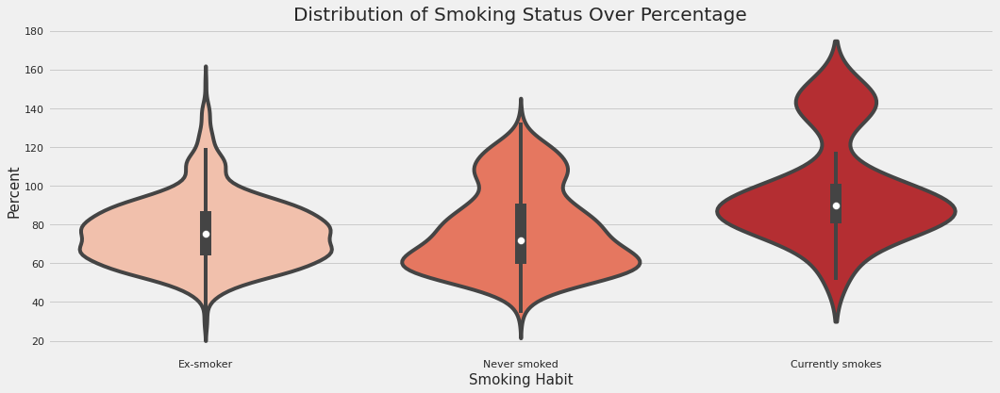

In [40]:
plt.figure(figsize = (16, 6))
ax = sns.violinplot(x = train_df['SmokingStatus'], y = train_df['Percent'], palette = 'Reds')
ax.set_xlabel(xlabel = 'Smoking Habit', fontsize = 15)
ax.set_ylabel(ylabel = 'Percent',fontsize = 15)
ax.set_title(label = 'Distribution of Smoking Status Over Percentage', fontsize = 20)
plt.show()

In [41]:
fig = px.scatter(train_df, x = ['Age'], y = 'Percent', color = 'SmokingStatus')
fig.show()

In [42]:
patient_df['Age'].iplot(kind = 'hist',
                       bins = 30,
                       color = 'red',
                       xTitle = 'Ages of distribution',
                       yTitle = 'Count')

In [43]:
patient_df['SmokingStatus'].value_counts()


Ex-smoker           118
Never smoked         49
Currently smokes      9
Name: SmokingStatus, dtype: int64

Text(0.5, 1.0, 'Distribution of Ages')

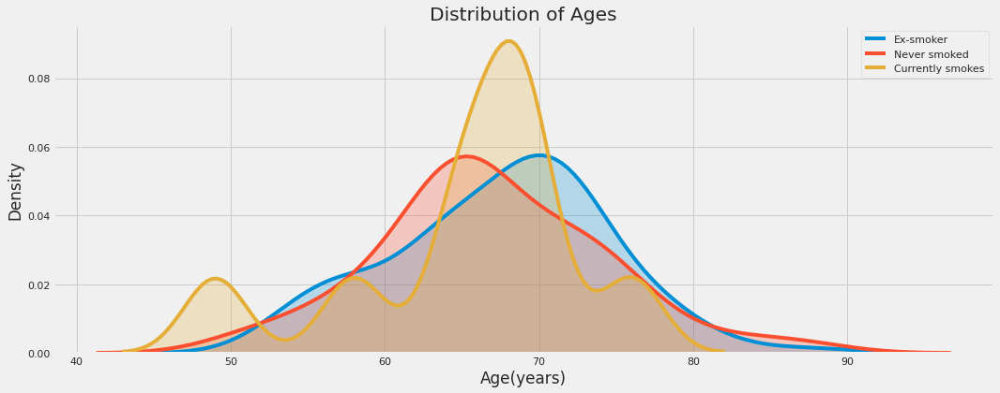

In [44]:
plt.figure(figsize = (16, 6))
sns.kdeplot(patient_df.loc[patient_df['SmokingStatus'] == 'Ex-smoker', 'Age'],
           label = 'Ex-smoker', shade = True)
sns.kdeplot(patient_df.loc[patient_df['SmokingStatus'] == 'Never smoked', 'Age'],
                           label = 'Never smoked', shade = True)
sns.kdeplot(patient_df.loc[patient_df['SmokingStatus'] == 'Currently smokes', 'Age'],
           label = 'Currently smokes', shade = True)

plt.xlabel('Age(years)')
plt.ylabel('Density')
plt.title('Distribution of Ages')

Text(0.5, 1.0, 'Distribution of Ages')

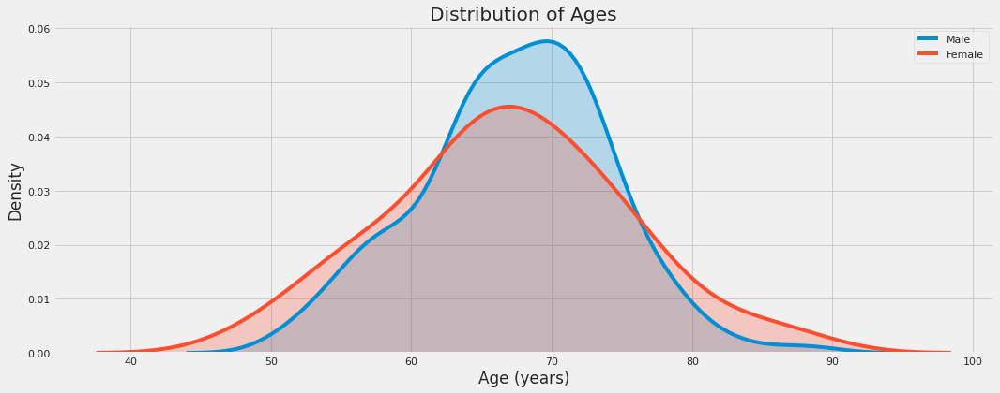

In [45]:
plt.figure(figsize = (16, 6))
sns.kdeplot(patient_df.loc[patient_df['Sex'] == 'Male', 'Age'], label = 'Male', shade = True)
sns.kdeplot(patient_df.loc[patient_df['Sex'] == 'Female', 'Age'], label = 'Female', shade = True)
plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.title('Distribution of Ages')



In [46]:
patient_df['Sex'].value_counts()

Male      139
Female     37
Name: Sex, dtype: int64

In [47]:
patient_df['Sex'].value_counts().iplot(kind = 'bar',
                                      yTitle = 'Count',
                                      linecolor = 'black',
                                      opacity = 0.7,
                                       color = 'blue',
                                      theme = 'pearl',
                                      bargap = 0.8,
                                      gridcolor = 'white',
                                      title = 'Dsitribution of the Sex column in Patient Dataframe')

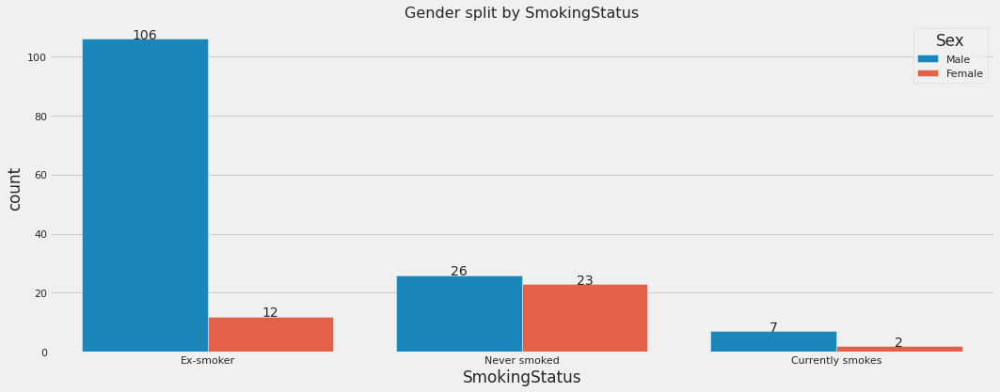

In [48]:
plt.figure(figsize = (16, 6))
a = sns.countplot(data = patient_df, x = 'SmokingStatus', hue = 'Sex')

for p in a.patches:
    a.annotate(format(p.get_height(), ','),
              (p.get_x() + p.get_width() / 2,
              p.get_height()), ha = 'center', va = 'center',
              xytext = (0, 4), textcoords = 'offset points')

plt.title('Gender split by SmokingStatus', fontsize = 16)
sns.despine(left = True, bottom = True)


In [49]:
fig = px.box(patient_df, x = 'Sex', y = 'Age', points = 'all')
fig.show()


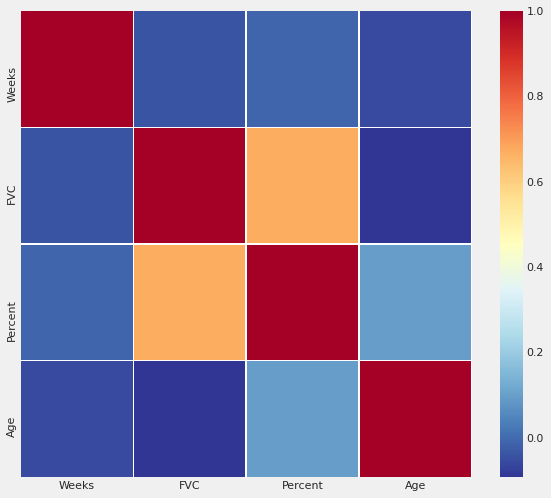

In [50]:
corrmat = train_df.corr()
f, ax = plt.subplots(figsize = (9, 8))
sns.heatmap(corrmat, ax = ax, cmap = 'RdYlBu_r', linewidths = 0.5)


In [51]:
print(Fore.YELLOW + 'Train .dcm number of images: ', Style.RESET_ALL, 
      len(list(os.listdir('../input/osic-pulmonary-fibrosis-progression/train'))), '\n' +
     Fore.BLUE + 'Test .dcm number of images: ', Style.RESET_ALL, len(list(os.listdir('../input/osic-pulmonary-fibrosis-progression/train'))),
     '\n' + '------------------------------','\n' + 'There is the same number of images as in train/ test.csv datasets')

Train .dcm number of images:   176 
Test .dcm number of images:   176 
------------------------------ 
There is the same number of images as in train/ test.csv datasets


In [52]:
def look_pixey_array(dataset, figsize = (5, 5)):
    plt.figure(figsize = figsize)
    plt.grid(False)
    plt.imshow(dataset.pixel_array, cmap = 'gray')
    plt.show()

total images for patient ID00123637202217151272140:  258


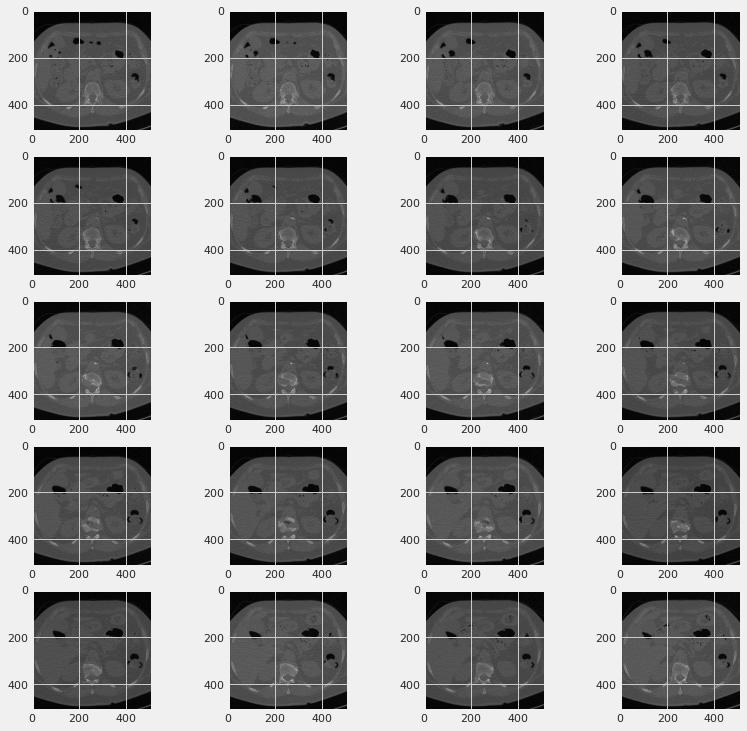

In [53]:
imdir = '/kaggle/input/osic-pulmonary-fibrosis-progression/train/ID00123637202217151272140'
print("total images for patient ID00123637202217151272140: ", len(os.listdir(imdir)))
fig = plt.figure(figsize = (12, 12))
columns = 4
rows = 5
imglist = os.listdir(imdir)
for i in range(1, columns * rows + 1):
    filename = imdir + '/' + str(i) + '.dcm'
    ds = pydicom.dcmread(filename)
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap = 'gray')
plt.show()

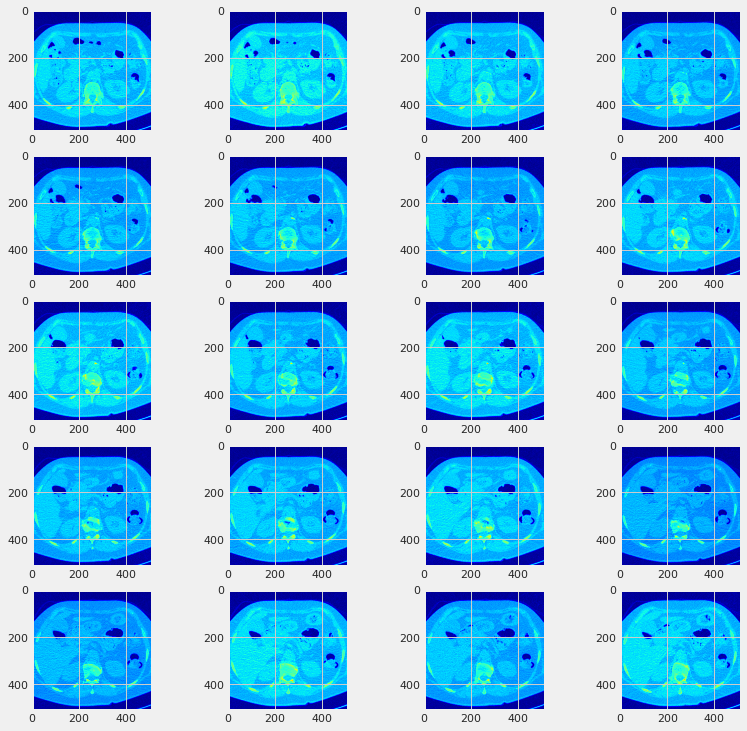

In [54]:
len(os.listdir(imdir))

fig = plt.figure(figsize = (12, 12))
columns = 4
rows = 5

imglist = os.listdir(imdir)
for i in range(1, columns * rows + 1):
    filename = imdir + '/' + str(i) + '.dcm'
    ds = pydicom.dcmread(filename)
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap = 'jet')
plt.show()


In [55]:
import glob

apply_resample = False

In [56]:
def load_scan(path):
    slices = [pydicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thiskness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
    
    for s in slices:
        s.SliceThickness = slice_thickness
        
    return slices

In [57]:
def get_pixels_hu(slices):
    image = np.stack([s.pixel_array for s in slices])
    image = image.astype(np.int16)
    image[image == -2000] = 0
    
    for slice_number in range(len(slices)):
        intercept = slices[slice_number].RescaleIntercept
        slope = slices[slice_number].RescaleSlope
        if slope != 1:
            image[slice_number] = slope * image[slice_number].astype(np.float64)
            image[slice_number] = image[slice_number].astype(np.int16)
        image[slice_number] += np.int16(intercept)
        
    return np.array(image, dtype = np.int16)

In [58]:
def set_lungwin(img, hu = [-1200, 600]):
    lungwin = np.array(hu)
    newimg = (img - lungwin[0]) / (lungwin[1] - lungwin[0])
    newimg[newimg < 0] = 0
    newimg[newimg > 1] = 1
    newimg = (newimg * 255).astype('uint8')
    return newimg

In [59]:
scans = load_scan('../input/osic-pulmonary-fibrosis-progression/train/ID00007637202177411956430/')
scan_array = set_lungwin(get_pixels_hu(scans))

In [60]:
from scipy.ndimage.interpolation import zoom

def resample(imgs, spacing, new_spacing):
    new_shape = np.round(imgs.shape * spacing / new_spacing)
    true_spacing = spacing * imgs.shape / new_shape
    resize_factor = new_shape / imgs.shape
    imgs = zoom(imgs, resize_factor, mode = 'nearest')
    return imgs, true_spacing, new_shape

spacing_z = (scans[-1].ImagePositionPatient[2] - scans[0].ImagePositionPatient[2])/len(scans)

apply_resample = True

if apply_resample:
    scan_array_resample = resample(scan_array,np.array(np.array([spacing_z, *scans[0].PixelSpacing])), np.array([1, 1,1]))[0]
    
    

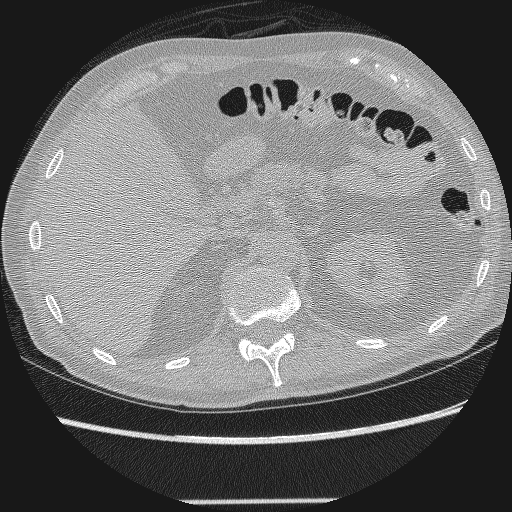

In [61]:
import imageio
from IPython.display import Image



imageio.mimsave('/tmp/gif.gif', scan_array, duration = 0.0001)
Image(filename = '/tmp/gif.gif', format = 'png')

In [62]:
patient_id = "ID00035637202182204917484"

dicom_path = "/kaggle/input/osic-pulmonary-fibrosis-progression/train"

files = np.array([f.replace(".dcm","") for f in os.listdir(f"{dicom_path}/{patient_id}/")])
files = -np.sort(-files.astype("int"))
dicoms = [f"{dicom_path}/{patient_id}/{f}.dcm" for f in files]

In [63]:
images = []
for dcm in dicoms:
    tmp = pydicom.dcmread(dcm)
    slope = tmp.RescaleSlope
    intercept = tmp.RescaleIntercept
    final = tmp.pixel_array*slope + intercept
    images.append(final)
    
images = np.array(images) 

In [64]:
fig = plt.figure()

ims = []
for image in range(0,images.shape[0],10):
    im = plt.imshow(images[image,:,:], animated=True, cmap=plt.cm.bone)
    plt.axis("off")
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=False,
                                repeat_delay=1000)

plt.close()

In [ ]:
def extract_dicom_meta_data(filename: str) -> Dict:
    image_data = pydicom.read_file(filenames)
    img = np.array(image_data.pixel_array).flatten()
    row = {'Patient':image_data.PatientID,
          'body_part_examined':image_data.BodyPartExamined,
          'image_position_patient':image_data.ImagePositionPatient,
          'image_orientation_patient':image_data.ImageOrientationPatient.
          'photometric_interpretation':image_data.PhotometricInterpretation,
          'row':image_data.Rows,
          'columns':image_data.Columns,
          'pixel_spacing':image_data.PixelSpacing,
          'window_center':image_data.WindowCenter,
          'window_width':image_data.WindowWidth,
          'modality':image_data.Modality,
          'StudyInstanceUID':image_data.StudyInstanceUID,
          'SeriesInstanceUID':image_data.SeriesInstanceUID,
          'StudyID':image_data.StudyID,
          'samplesPerPixel':image_data.SamplePerPixel,
          'BitsAllocated':image_data.BitsAllocated,
          'BitsStored':image_data.BitsStored,
          'HighBit':image_data.HighBit,
          'PixelRepresentation':image_data.PixelRepresentation,
          'RescaleIntercept':image_data.RescaleIntercept,
          'RescaleSlope':image_data.RescaleSlope,
          'img_min':np.min(img),
          'img_max':np.max(img),
          'img_mean':np.mean(img),
          'img_std':np.std(img)}
    
    return row

In [ ]:
train_image_path = '/kaggle/input/osic-pulmonary-fibrosis-progression/train'
train_image_files = glob.glob(os.path.join(train_image_path,'*', '*.dcm'))

meta_data_df = []
for filename in tqdm.tqdm(train_image_files):
    try:
        meta_data_df.append(extract_dicom_meta_data(filename))
    except Exception as e:
        continue

In [ ]:
meta_data_df = pd.DataFrame.from_dict(meta_data_df)
meta_data_df.head()

In [ ]:
extract_DICOM_attributes('train')

In [ ]:
import pandas_profiling as pdp


In [ ]:
train_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/train.csv')
test_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/test.csv')

In [ ]:
profile_train_df = pdp.ProfileReport(train_df)

profile_train_df